#Trabalho 2 de Introdução à Inteligência Artificial
**Autor:**

*   Rafael Cutrim de Almeida: 242039621

**Objetivo do Projeto:**

Este projeto implementa um modelo de IA generativa que diagnostica folhas doentes de uma planta, para isso utiliza-se o método de KATAFUCHI, Ryoya; TOKUNAGA, Terumasa.

In [ ]:
!pip install --upgrade numpy
!pip install torch torchvision torchsummary
!pip install opencv-python pillow matplotlib
!pip install grad-cam
!pip install ipywidgets
!pip install scikit-learn seaborn

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.1/62.1 kB 2.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.6/16.6 MB 67.4 MB/s eta 0:00:00
  Attempting uninstall: numpy
    Found existing installation: numpy 2.2.6
    Uninstalling numpy-2.2.6:
      Successfully uninstalled numpy-2.2.6
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tensorflow 2.16.2 requires numpy<2.0.0,>=1.26.0; python_version >= "3.12", but you have numpy 2.3.5 which is incompatible.
tf-keras 2.19.0 requires tensorflow<2.20,>=2.19, but you have tensorflow 2.16.2 which is incompatible.
tensorflow-text 2.19.0 requires tensorflow<2.20,>=2.19.0, but you have tensorflow 2.16.2 which is incompatible.
opencv-python-headless 4.12.0.88 requires numpy<2.3.0,>=2; python_version >= "3.9", but you have numpy 2.3.5 which is incompatible.
tensorflow-decision-forests 1.12.0 requires tens

  Using cached numpy-2.2.6-cp312-cp312-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (62 kB)
Using cached numpy-2.2.6-cp312-cp312-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (16.5 MB)
  Attempting uninstall: numpy
    Found existing installation: numpy 2.3.5
    Uninstalling numpy-2.3.5:
      Successfully uninstalled numpy-2.3.5
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tensorflow 2.16.2 requires numpy<2.0.0,>=1.26.0; python_version >= "3.12", but you have numpy 2.2.6 which is incompatible.
tf-keras 2.19.0 requires tensorflow<2.20,>=2.19, but you have tensorflow 2.16.2 which is incompatible.
tensorflow-text 2.19.0 requires tensorflow<2.20,>=2.19.0, but you have tensorflow 2.16.2 which is incompatible.
tensorflow-decision-forests 1.12.0 requires tensorflow==2.19.0, but you have tensorflow 2.16.2 which is incompatible.
jax 0.7.2 requires ml_dt

#Bibliotecas utilizadas

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import DataLoader, Dataset
from torchvision import transforms, models
import torchvision.utils as vutils
import numpy as np
import cv2
from PIL import Image
import matplotlib.pyplot as plt
from matplotlib import cm
import os
import glob
import random
from sklearn.metrics import roc_curve, auc, confusion_matrix
import seaborn as sns
import warnings
from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.image import show_cam_on_image
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget
from google.colab import files
import zipfile
import shutil
import time
from tqdm import tqdm

#Upload dos arquivos

In [ ]:
uploaded = files.upload()


Saving Projeto_Ramularia.zip to Projeto_Ramularia.zip


#Extração dos arquivos

   📦 Projeto_Ramularia.zip

🔄 Procurando por arquivos ZIP...
✅ Arquivos ZIP encontrados: ['Projeto_Ramularia.zip']

🎯 Usando arquivo: Projeto_Ramularia.zip

📂 INICIANDO EXTRAÇÃO DIRETA
📍 Diretório de extração: /content/Projeto_Ramularia
🗑️  Diretório anterior removido

🔄 Extraindo Projeto_Ramularia.zip...
✅ Extração concluída!

📁 Estrutura dentro de /content/Projeto_Ramularia:
   📂 Projeto_Ramularia/
      └── Healthy_Test50
      └── Disease_Test100
      └── Healthy_Train50

🔍 Buscando por pastas de imagens...
✅ Disease_Test100 encontrada em: /content/Projeto_Ramularia/Projeto_Ramularia/Disease_Test100
✅ Healthy_Test50 encontrada em: /content/Projeto_Ramularia/Projeto_Ramularia/Healthy_Test50
✅ Healthy_Train50 encontrada em: /content/Projeto_Ramularia/Projeto_Ramularia/Healthy_Train50

📸 Coletando imagens...
   ✅ Disease_Test100: 100 imagens
   ✅ Healthy_Test50: 50 imagens
   ✅ Healthy_Train50: 50 imagens
✅ Disease_Test100: a1001-1003 ab_0.jpg (1276x1515)
✅ Healthy_Test50: leaf a1-a3

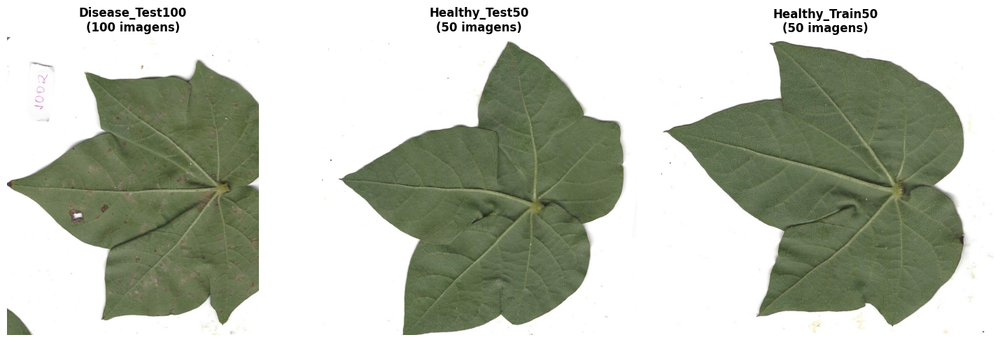


📊 RESUMO FINAL
Disease_Test100      | 100 imagens
Healthy_Test50       |  50 imagens
Healthy_Train50      |  50 imagens
TOTAL                | 200 imagens


In [ ]:
all_files = os.listdir('/content')
for file in all_files:
    if file.endswith('.zip') or 'zip_filename' in file or 'upload' in file:
        print(f"   📦 {file}")

print("\n🔄 Procurando por arquivos ZIP...")
zip_files = [f for f in all_files if f.endswith('.zip')]
print(f"✅ Arquivos ZIP encontrados: {zip_files}")

if zip_files:
    zip_filename = zip_files[0]
    print(f"\n🎯 Usando arquivo: {zip_filename}")
else:
    print("\n❌ Nenhum arquivo ZIP encontrado!")
    print("   Execute novamente a célula de upload.")
    raise FileNotFoundError("Arquivo ZIP não encontrado")

print("\n" + "="*60)
print("📂 INICIANDO EXTRAÇÃO DIRETA")
print("="*60)

extract_dir = "/content/Projeto_Ramularia"
print(f"📍 Diretório de extração: {extract_dir}")

if os.path.exists(extract_dir):
    import shutil
    shutil.rmtree(extract_dir)
    print("🗑️  Diretório anterior removido")

print(f"\n🔄 Extraindo {zip_filename}...")
with zipfile.ZipFile(zip_filename, 'r') as zip_ref:
    zip_ref.extractall(extract_dir)
print("✅ Extração concluída!")

print(f"\n📁 Estrutura dentro de {extract_dir}:")
for item in os.listdir(extract_dir):
    item_path = os.path.join(extract_dir, item)
    if os.path.isdir(item_path):
        print(f"   📂 {item}/")
        try:
            subitems = os.listdir(item_path)
            for subitem in subitems[:5]:
                print(f"      └── {subitem}")
            if len(subitems) > 5:
                print(f"      └── ... e mais {len(subitems)-5} itens")
        except:
            pass
    else:
        print(f"   📄 {item}")

print("\n🔍 Buscando por pastas de imagens...")

all_folders = []
for root, dirs, files in os.walk(extract_dir):
    for dir_name in dirs:
        full_path = os.path.join(root, dir_name)
        all_folders.append(full_path)

target_patterns = [
    ('Disease_Test100', ['disease', 'test100', 'doente']),
    ('Healthy_Test50', ['healthy_test', 'test50', 'saudavel_test']),
    ('Healthy_Train50', ['healthy_train', 'train50', 'saudavel_train'])
]

found_folders = {}

for target_name, keywords in target_patterns:
    found = False
    for folder_path in all_folders:
        folder_name = os.path.basename(folder_path).lower()

        if any(keyword in folder_name for keyword in keywords):
            found_folders[target_name] = folder_path
            print(f"✅ {target_name} encontrada em: {folder_path}")
            found = True
            break

    if not found:
        print(f"⚠️  {target_name} não encontrada")


print("\n📸 Coletando imagens...")
image_collections = {}

for target_name, folder_path in found_folders.items():

    image_extensions = ['.jpg', '.jpeg', '.png', '.bmp', '.tiff']
    images = []

    for ext in image_extensions:

        pattern = os.path.join(folder_path, f"*{ext}")
        images.extend(glob.glob(pattern))
        images.extend(glob.glob(pattern.upper()))


    images.sort()
    image_collections[target_name] = images

    print(f"   ✅ {target_name}: {len(images)} imagens")


fig, axes = plt.subplots(1, len(image_collections), figsize=(15, 5))

if len(image_collections) == 1:
    axes = [axes]

for idx, (folder_name, images) in enumerate(image_collections.items()):
    ax = axes[idx]

    if images:
        try:
            img_path = images[0]
            img = Image.open(img_path)

            ax.imshow(img)
            ax.set_title(f"{folder_name}\n({len(images)} imagens)", fontsize=12, weight='bold')
            ax.set_xlabel(f"Arquivo: {os.path.basename(img_path)}", fontsize=10)
            ax.axis('off')

            print(f"✅ {folder_name}: {os.path.basename(img_path)} ({img.size[0]}x{img.size[1]})")

        except Exception as e:
            ax.text(0.5, 0.5, f'Erro\n{str(e)[:20]}', ha='center', va='center')
            ax.set_title(folder_name, fontsize=12)
            ax.axis('off')
    else:
        ax.text(0.5, 0.5, 'Sem imagens', ha='center', va='center')
        ax.set_title(folder_name, fontsize=12)
        ax.axis('off')

plt.tight_layout()
plt.show()

print("\n" + "="*60)
print("📊 RESUMO FINAL")
print("="*60)

for folder_name, images in image_collections.items():
    print(f"{folder_name:20} | {len(images):3d} imagens")

print("="*60)
print(f"{'TOTAL':20} | {sum(len(imgs) for imgs in image_collections.values()):3d} imagens")


#Preparação dos dados e implementação do modelo base

  Nesta etapa, configuramos o ambiente e preparamos os dados para o
treinamento. Primeiro, verificamos a disponibilidade de GPU e configuramos as transformações de imagem (redimensionamento, normalização e aumento de dados). Em seguida, criamos um dataset personalizado que carrega e organiza as imagens do projeto Ramularia, separando-as em conjuntos de treino (50 imagens saudáveis) e teste (50 saudáveis + 100 doentes). Por fim, implementamos a arquitetura do autoencoder convolucional que servirá como base para o método de detecção de anomalias proposto no artigo.

📱 Dispositivo selecionado: cpu

🏗️  Implementando U-Net simplificado...
🏗️  Implementando Autoencoder simples...
🏗️  Implementando Discriminator simples...

🧪 Testando modelos...

📊 Testando Autoencoder...
   Input: torch.Size([2, 3, 256, 256])
   Output: torch.Size([2, 3, 256, 256])
   ✅ Autoencoder funcionando!

📊 Testando Discriminator...
   Input: torch.Size([2, 3, 256, 256])
   Output: torch.Size([2, 1, 15, 15])
   ✅ Discriminator funcionando!

📊 Arquitetura do Autoencoder:
SimpleAutoencoder(
  (encoder): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): ReLU(inplace=True)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): 

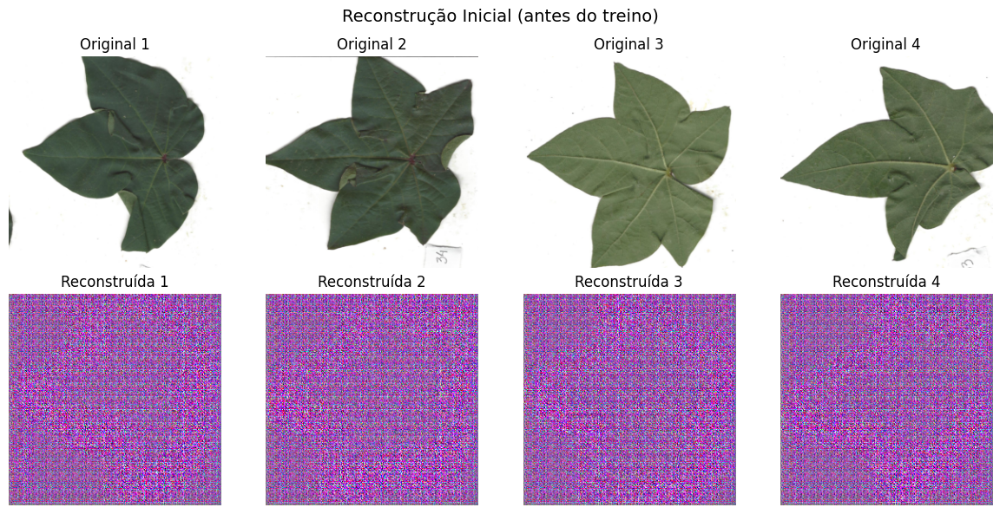


📈 Métrica inicial de reconstrução...


In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"📱 Dispositivo selecionado: {device}")


print("\n🏗️  Implementando U-Net simplificado...")

class SimpleUNet(nn.Module):
    """U-Net simplificado e funcional"""

    def __init__(self, in_channels=3, out_channels=3):
        super(SimpleUNet, self).__init__()

        # Encoder
        self.enc1 = self.conv_block(in_channels, 64)
        self.enc2 = self.conv_block(64, 128)
        self.enc3 = self.conv_block(128, 256)
        self.enc4 = self.conv_block(256, 512)

        # Decoder com skip connections
        self.dec4 = self.upconv_block(512, 256)
        self.dec3 = self.upconv_block(512, 128)  # 256*2 = 512
        self.dec2 = self.upconv_block(256, 64)   # 128*2 = 256
        self.dec1 = self.upconv_block(128, 64)   # 64*2 = 128

        # Camada final
        self.final = nn.Conv2d(64, out_channels, kernel_size=1)

    def conv_block(self, in_ch, out_ch):
        """Bloco convolucional para downsampling"""
        return nn.Sequential(
            nn.Conv2d(in_ch, out_ch, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_ch),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_ch, out_ch, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_ch),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(2)
        )

    def upconv_block(self, in_ch, out_ch):
        """Bloco para upsampling"""
        return nn.Sequential(
            nn.ConvTranspose2d(in_ch, out_ch, kernel_size=2, stride=2),
            nn.Conv2d(out_ch, out_ch, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_ch),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_ch, out_ch, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_ch),
            nn.ReLU(inplace=True)
        )

    def forward(self, x):
        # Encoder
        e1 = self.enc1(x)      # 256 -> 128
        e2 = self.enc2(e1)     # 128 -> 64
        e3 = self.enc3(e2)     # 64 -> 32
        e4 = self.enc4(e3)     # 32 -> 16

        # Decoder com skip connections
        d4 = self.dec4(e4)                     # 16 -> 32
        d4 = torch.cat([d4, e3], dim=1)       # Concatena

        d3 = self.dec3(d4)                     # 32 -> 64
        d3 = torch.cat([d3, e2], dim=1)       # Concatena

        d2 = self.dec2(d3)                     # 64 -> 128
        d2 = torch.cat([d2, e1], dim=1)       # Concatena

        d1 = self.dec1(d2)                     # 128 -> 256

        return torch.tanh(self.final(d1))

print("🏗️  Implementando Autoencoder simples...")

class SimpleAutoencoder(nn.Module):
    """Autoencoder simples para reconstrução"""

    def __init__(self):
        super(SimpleAutoencoder, self).__init__()

        # Encoder
        self.encoder = nn.Sequential(
            nn.Conv2d(3, 64, 4, 2, 1),           # 256 -> 128
            nn.ReLU(True),
            nn.Conv2d(64, 128, 4, 2, 1),         # 128 -> 64
            nn.BatchNorm2d(128),
            nn.ReLU(True),
            nn.Conv2d(128, 256, 4, 2, 1),        # 64 -> 32
            nn.BatchNorm2d(256),
            nn.ReLU(True),
            nn.Conv2d(256, 512, 4, 2, 1),        # 32 -> 16
            nn.BatchNorm2d(512),
            nn.ReLU(True),
        )

        # Decoder
        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(512, 256, 4, 2, 1),  # 16 -> 32
            nn.BatchNorm2d(256),
            nn.ReLU(True),
            nn.ConvTranspose2d(256, 128, 4, 2, 1),  # 32 -> 64
            nn.BatchNorm2d(128),
            nn.ReLU(True),
            nn.ConvTranspose2d(128, 64, 4, 2, 1),   # 64 -> 128
            nn.BatchNorm2d(64),
            nn.ReLU(True),
            nn.ConvTranspose2d(64, 3, 4, 2, 1),     # 128 -> 256
            nn.Tanh()
        )

    def forward(self, x):
        encoded = self.encoder(x)
        decoded = self.decoder(encoded)
        return decoded

print("🏗️  Implementando Discriminator simples...")

class SimpleDiscriminator(nn.Module):
    def __init__(self):
        super(SimpleDiscriminator, self).__init__()

        self.model = nn.Sequential(
            nn.Conv2d(3, 64, 4, 2, 1),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(64, 128, 4, 2, 1),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(128, 256, 4, 2, 1),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(256, 512, 4, 2, 1),
            nn.BatchNorm2d(512),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(512, 1, 4, 1, 1),
            nn.Sigmoid()
        )

    def forward(self, x):
        return self.model(x)

print("\n🧪 Testando modelos...")

# Cria modelos
autoencoder = SimpleAutoencoder().to(device)
generator = SimpleAutoencoder().to(device)  # Usa a mesma arquitetura
discriminator = SimpleDiscriminator().to(device)

# Testa forward pass
test_input = torch.randn(2, 3, 256, 256).to(device)

print("\n📊 Testando Autoencoder...")
with torch.no_grad():
    output_ae = autoencoder(test_input)
    print(f"   Input: {test_input.shape}")
    print(f"   Output: {output_ae.shape}")
    print(f"   ✅ Autoencoder funcionando!")

print("\n📊 Testando Discriminator...")
with torch.no_grad():
    output_disc = discriminator(test_input)
    print(f"   Input: {test_input.shape}")
    print(f"   Output: {output_disc.shape}")
    print(f"   ✅ Discriminator funcionando!")

print("\n📊 Arquitetura do Autoencoder:")
print(autoencoder)

print("\n📊 Arquitetura do Discriminator:")
print(discriminator)

print("\n📊 Preparando dados...")

# Transformação básica
transform = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.ToTensor(),
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
])

# Dataset básico
class BasicDataset(Dataset):
    def __init__(self, image_paths, transform=None):
        self.image_paths = image_paths
        self.transform = transform

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        img = Image.open(self.image_paths[idx]).convert('RGB')
        if self.transform:
            img = self.transform(img)
        return img, img  # Autoencoder: input = target

# Usa algumas imagens para teste
train_images = image_collections.get('Healthy_Train50', [])[:20]
test_healthy = image_collections.get('Healthy_Test50', [])[:10]
test_diseased = image_collections.get('Disease_Test100', [])[:10]

print(f"   Imagens de treino: {len(train_images)}")
print(f"   Imagens de teste saudáveis: {len(test_healthy)}")
print(f"   Imagens de teste doentes: {len(test_diseased)}")

# Cria datasets
train_dataset = BasicDataset(train_images, transform=transform)
test_healthy_dataset = BasicDataset(test_healthy, transform=transform)
test_diseased_dataset = BasicDataset(test_diseased, transform=transform)

# Cria dataloaders
batch_size = 4
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_healthy_loader = DataLoader(test_healthy_dataset, batch_size=batch_size, shuffle=False)
test_diseased_loader = DataLoader(test_diseased_dataset, batch_size=batch_size, shuffle=False)

print("\n🎯 Testando reconstrução inicial...")

# Pega um batch
sample_batch, _ = next(iter(train_loader))
sample_batch = sample_batch.to(device)

with torch.no_grad():
    reconstructed = autoencoder(sample_batch)

# Função para visualizar
def show_images(original, reconstructed, title="Reconstrução"):
    fig, axes = plt.subplots(2, 4, figsize=(12, 6))

    for i in range(min(4, original.shape[0])):
        # Original
        orig = original[i].cpu().permute(1, 2, 0).numpy()
        orig = (orig * 0.5) + 0.5  # Desnormaliza
        axes[0, i].imshow(np.clip(orig, 0, 1))
        axes[0, i].set_title(f'Original {i+1}')
        axes[0, i].axis('off')

        # Reconstruída
        recon = reconstructed[i].cpu().permute(1, 2, 0).numpy()
        recon = (recon * 0.5) + 0.5  # Desnormaliza
        axes[1, i].imshow(np.clip(recon, 0, 1))
        axes[1, i].set_title(f'Reconstruída {i+1}')
        axes[1, i].axis('off')

    plt.suptitle(title, fontsize=14)
    plt.tight_layout()
    plt.show()

# Mostra resultados
show_images(sample_batch, reconstructed, "Reconstrução Inicial (antes do treino)")

print("\n📈 Métrica inicial de reconstrução...")

def calculate_mse(original, reconstructed):
    """Calcula MSE entre original e reconstruído"""
    mse = F.mse_loss(original, reconstructed)
    return mse.item()

mse_initial = calculate_mse(sample_batch, reconstructed)

# Para autoencoder simples
criterion_ae = nn.MSELoss()
optimizer_ae = torch.optim.Adam(autoencoder.parameters(), lr=0.001)

# Para GAN (pix2pix)
criterion_gan = nn.BCELoss()
criterion_l1 = nn.L1Loss()
lambda_l1 = 100

optimizer_g = torch.optim.Adam(generator.parameters(), lr=0.0002, betas=(0.5, 0.999))
optimizer_d = torch.optim.Adam(discriminator.parameters(), lr=0.0002, betas=(0.5, 0.999))


#Treinamento

Nesta etapa, realizamos o treinamento do autoencoder usando apenas as imagens de folhas saudáveis. Implementamos um loop de treinamento que, por várias épocas, ajusta os pesos do modelo para minimizar a diferença entre as imagens originais e suas reconstruções. Utilizamos uma função de perda combinada (MSE + L1) para garantir boa qualidade de reconstrução, otimizador Adam com scheduler para ajuste automático da taxa de aprendizado, e early stopping para prevenir overfitting. O modelo aprende a reconstruir características saudáveis, preparando-se para identificar anomalias nas folhas doentes através dos erros de reconstrução.


📈 Treinando por 30 épocas...

🔄 Iniciando treinamento...


Época 1/30: 100%|██████████| 5/5 [00:12<00:00,  2.41s/it, loss=0.179794]


Época 1/30 - Loss: 0.271100


Época 2/30: 100%|██████████| 5/5 [00:11<00:00,  2.21s/it, loss=0.095283]


Época 2/30 - Loss: 0.117712


Época 3/30: 100%|██████████| 5/5 [00:11<00:00,  2.33s/it, loss=0.065986]


Época 3/30 - Loss: 0.077062


Época 4/30: 100%|██████████| 5/5 [00:12<00:00,  2.43s/it, loss=0.059738]


Época 4/30 - Loss: 0.060802


Época 5/30: 100%|██████████| 5/5 [00:11<00:00,  2.29s/it, loss=0.046468]


Época 5/30 - Loss: 0.051233 - Val Loss: 0.121891


Época 6/30: 100%|██████████| 5/5 [00:11<00:00,  2.27s/it, loss=0.045696]


Época 6/30 - Loss: 0.045967


Época 7/30: 100%|██████████| 5/5 [00:11<00:00,  2.28s/it, loss=0.037214]


Época 7/30 - Loss: 0.039605


Época 8/30: 100%|██████████| 5/5 [00:11<00:00,  2.39s/it, loss=0.033244]


Época 8/30 - Loss: 0.036358


Época 9/30: 100%|██████████| 5/5 [00:11<00:00,  2.28s/it, loss=0.033108]


Época 9/30 - Loss: 0.032560


Época 10/30: 100%|██████████| 5/5 [00:10<00:00,  2.12s/it, loss=0.024717]


Época 10/30 - Loss: 0.030246 - Val Loss: 0.028014


Época 11/30: 100%|██████████| 5/5 [00:10<00:00,  2.07s/it, loss=0.027255]


Época 11/30 - Loss: 0.029063


Época 12/30: 100%|██████████| 5/5 [00:11<00:00,  2.24s/it, loss=0.028817]


Época 12/30 - Loss: 0.025800


Época 13/30: 100%|██████████| 5/5 [00:11<00:00,  2.28s/it, loss=0.022318]


Época 13/30 - Loss: 0.023637


Época 14/30: 100%|██████████| 5/5 [00:11<00:00,  2.28s/it, loss=0.025845]


Época 14/30 - Loss: 0.022678


Época 15/30: 100%|██████████| 5/5 [00:11<00:00,  2.30s/it, loss=0.023919]


Época 15/30 - Loss: 0.021917 - Val Loss: 0.019625


Época 16/30: 100%|██████████| 5/5 [00:11<00:00,  2.28s/it, loss=0.016758]


Época 16/30 - Loss: 0.021443


Época 17/30: 100%|██████████| 5/5 [00:11<00:00,  2.22s/it, loss=0.020734]


Época 17/30 - Loss: 0.020408


Época 18/30: 100%|██████████| 5/5 [00:10<00:00,  2.10s/it, loss=0.019791]


Época 18/30 - Loss: 0.018448


Época 19/30: 100%|██████████| 5/5 [00:11<00:00,  2.28s/it, loss=0.014362]


Época 19/30 - Loss: 0.016075


Época 20/30: 100%|██████████| 5/5 [00:11<00:00,  2.31s/it, loss=0.017421]


Época 20/30 - Loss: 0.017182 - Val Loss: 0.013448


Época 21/30: 100%|██████████| 5/5 [00:11<00:00,  2.28s/it, loss=0.014604]


Época 21/30 - Loss: 0.018381


Época 22/30: 100%|██████████| 5/5 [00:11<00:00,  2.28s/it, loss=0.012754]


Época 22/30 - Loss: 0.016439


Época 23/30: 100%|██████████| 5/5 [00:11<00:00,  2.29s/it, loss=0.019653]


Época 23/30 - Loss: 0.014964


Época 24/30: 100%|██████████| 5/5 [00:10<00:00,  2.19s/it, loss=0.013673]


Época 24/30 - Loss: 0.014953


Época 25/30: 100%|██████████| 5/5 [00:10<00:00,  2.13s/it, loss=0.018956]


Época 25/30 - Loss: 0.014209 - Val Loss: 0.014931


Época 26/30: 100%|██████████| 5/5 [00:10<00:00,  2.17s/it, loss=0.014546]


Época 26/30 - Loss: 0.012514


Época 27/30: 100%|██████████| 5/5 [00:11<00:00,  2.29s/it, loss=0.014573]


Época 27/30 - Loss: 0.011843


Época 28/30: 100%|██████████| 5/5 [00:11<00:00,  2.29s/it, loss=0.012830]


Época 28/30 - Loss: 0.011817


Época 29/30: 100%|██████████| 5/5 [00:11<00:00,  2.28s/it, loss=0.010805]


Época 29/30 - Loss: 0.012268


Época 30/30: 100%|██████████| 5/5 [00:11<00:00,  2.39s/it, loss=0.011501]


Época 30/30 - Loss: 0.010484 - Val Loss: 0.010604

✅ Treinamento concluído em 352.60 segundos!
💾 Modelo salvo como 'autoencoder_trained.pth'

📊 Visualizando evolução da perda...


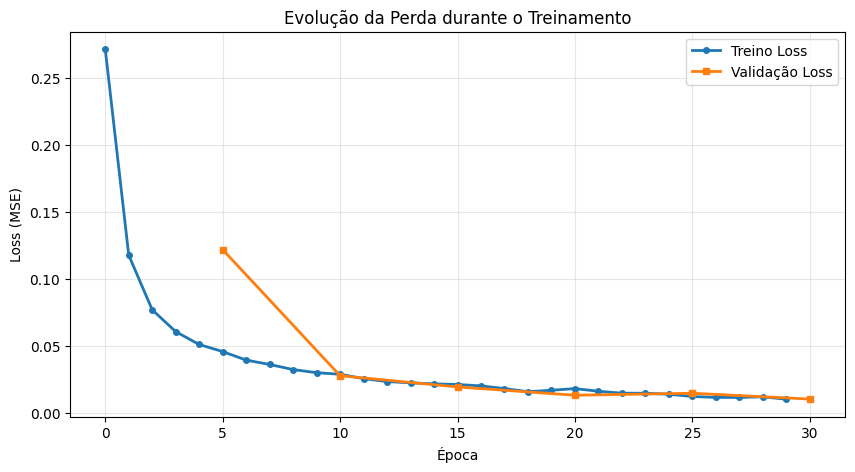


🎯 Testando reconstrução após treinamento...


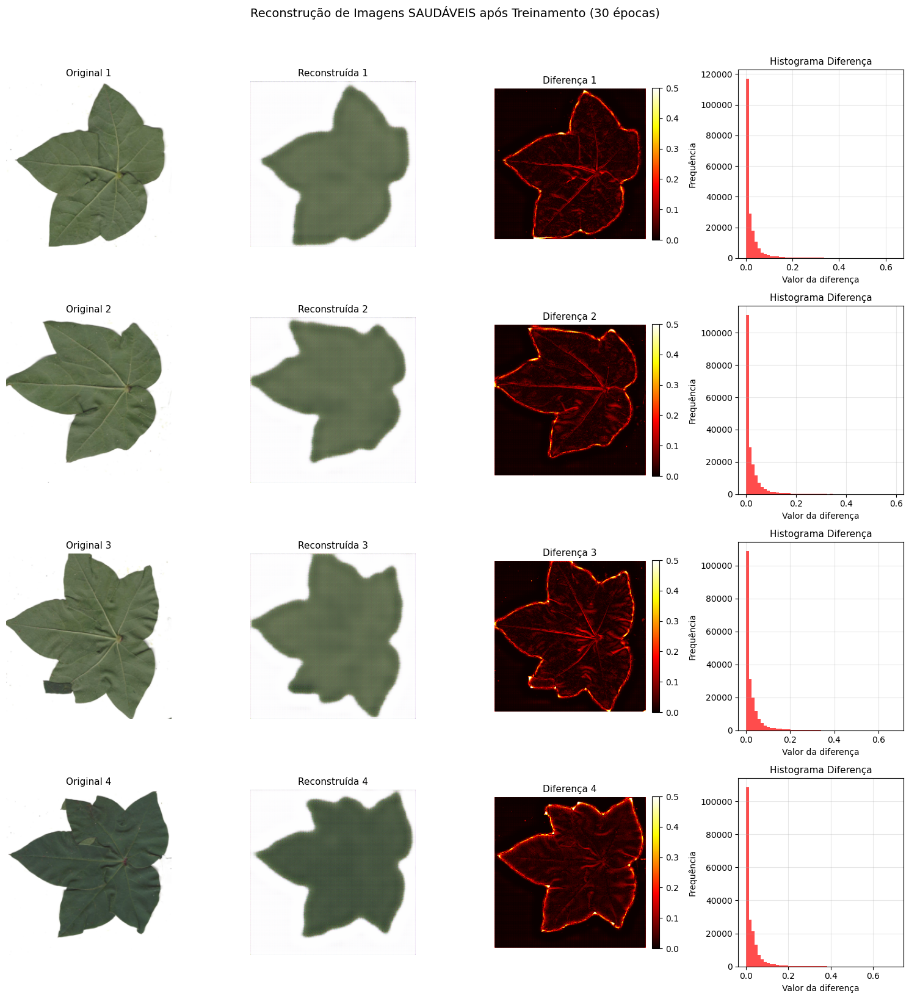


🔍 Testando com imagens DOENTES...


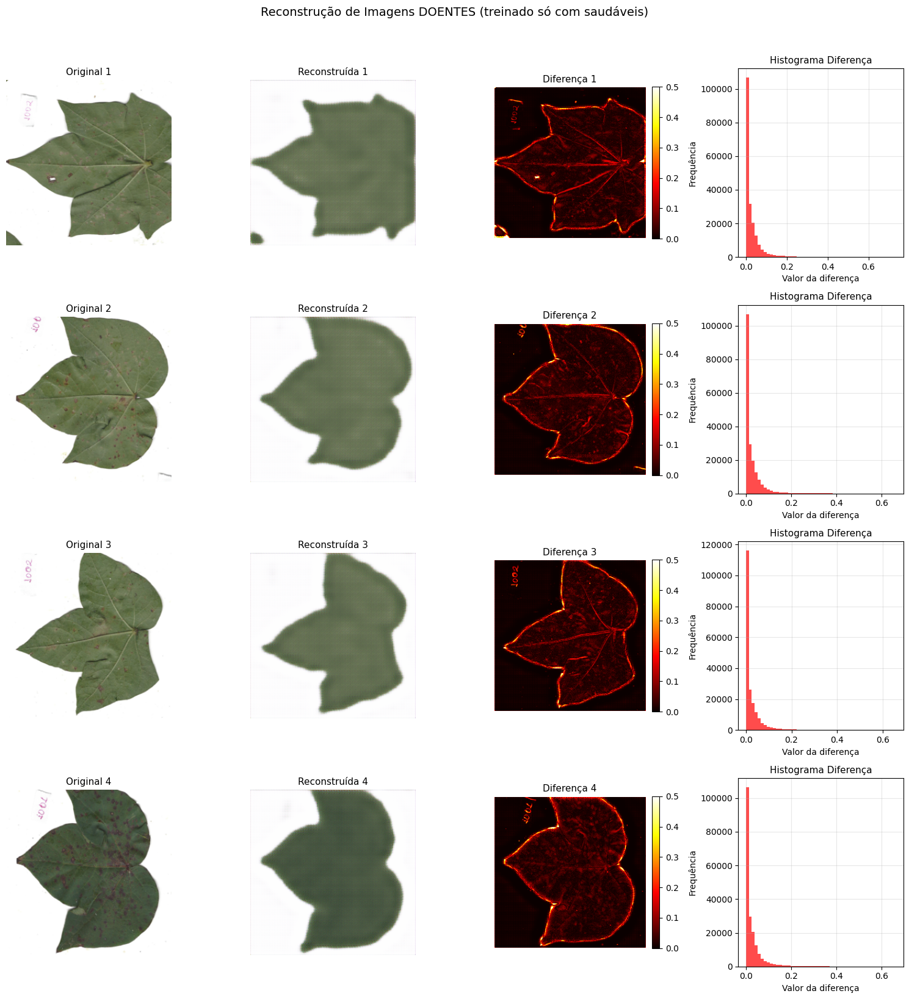


📊 CALCULANDO MÉTRICAS DE RECONSTRUÇÃO...

📈 Métricas para imagens SAUDÁVEIS:
   MSE: 0.010738
   MAE: 0.051641
   Erro máximo: 1.414362

📈 Métricas para imagens DOENTES:
   MSE: 0.011287
   MAE: 0.054395
   Erro máximo: 1.469379

🔬 DETECTANDO ANOMALIAS...

🎯 Scores de anomalia (média da diferença absoluta):
   Saudáveis: 0.051641
   Doentes: 0.054395
   Diferença: 0.002755

📏 Threshold sugerido (média): 0.053018

🧪 TESTANDO CLASSIFICAÇÃO EM TODAS AS IMAGENS...
   Total saudáveis avaliados: 10
   Total doentes avaliados: 10
   Score médio saudáveis: 0.050700
   Score médio doentes: 0.055844

📊 RESULTADOS DE CLASSIFICAÇÃO:
   Acurácia: 70.00%
   Verdadeiros Positivos (doentes detectados): 8/10
   Verdadeiros Negativos (saudáveis corretos): 6/10
   Falsos Positivos: 4
   Falsos Negativos: 2

📈 Visualizando distribuição dos scores de anomalia...


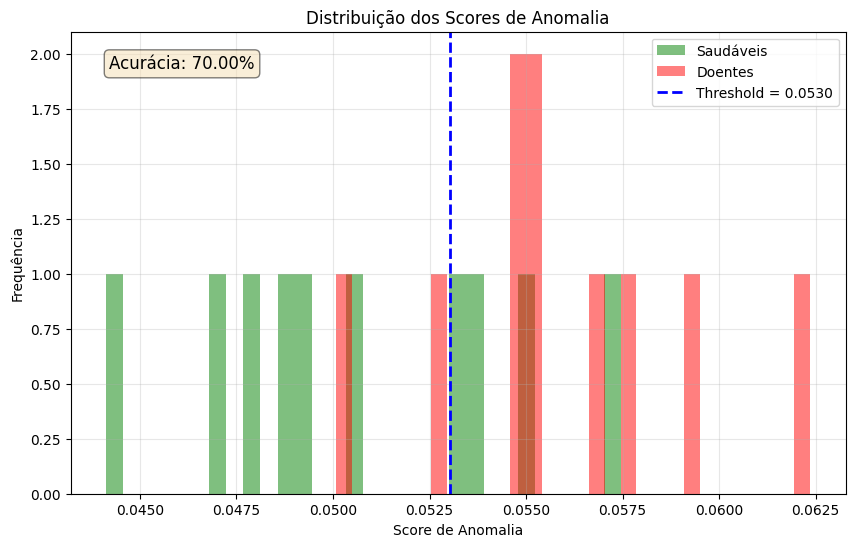

In [ ]:
num_epochs = 30  # Reduzido para teste mais rápido
print(f"\n📈 Treinando por {num_epochs} épocas...")

# Listas para monitoramento
train_losses = []
val_losses = []

# 2. Loop de treinamento
print("\n🔄 Iniciando treinamento...")
autoencoder.train()

start_time = time.time()

for epoch in range(num_epochs):
    epoch_loss = 0
    batch_count = 0

    # Barra de progresso
    pbar = tqdm(train_loader, desc=f'Época {epoch+1}/{num_epochs}')

    for batch_idx, (inputs, targets) in enumerate(pbar):
        inputs = inputs.to(device)
        targets = targets.to(device)

        # Forward pass
        optimizer_ae.zero_grad()
        outputs = autoencoder(inputs)

        # Calcula perda
        loss = criterion_ae(outputs, targets)

        # Backward pass
        loss.backward()
        optimizer_ae.step()

        # Atualiza métricas
        epoch_loss += loss.item()
        batch_count += 1

        # Atualiza barra de progresso (CORRIGIDO)
        pbar.set_postfix({'loss': f'{loss.item():.6f}'})

    # Calcula perda média da época
    avg_loss = epoch_loss / batch_count
    train_losses.append(avg_loss)

    # Validação rápida a cada 5 épocas
    if (epoch + 1) % 5 == 0:
        autoencoder.eval()
        val_loss = 0
        val_batches = 0

        with torch.no_grad():
            for inputs, targets in test_healthy_loader:
                inputs = inputs.to(device)
                targets = targets.to(device)

                outputs = autoencoder(inputs)
                loss = criterion_ae(outputs, targets)
                val_loss += loss.item()
                val_batches += 1

        avg_val_loss = val_loss / val_batches if val_batches > 0 else 0
        val_losses.append(avg_val_loss)

        autoencoder.train()

        print(f'Época {epoch+1}/{num_epochs} - Loss: {avg_loss:.6f} - Val Loss: {avg_val_loss:.6f}')
    else:
        print(f'Época {epoch+1}/{num_epochs} - Loss: {avg_loss:.6f}')

end_time = time.time()
training_time = end_time - start_time

print(f"\n✅ Treinamento concluído em {training_time:.2f} segundos!")

torch.save({
    'epoch': num_epochs,
    'model_state_dict': autoencoder.state_dict(),
    'optimizer_state_dict': optimizer_ae.state_dict(),
    'loss': train_losses[-1],
}, 'autoencoder_trained.pth')

print("💾 Modelo salvo como 'autoencoder_trained.pth'")

print("\n📊 Visualizando evolução da perda...")

plt.figure(figsize=(10, 5))
plt.plot(train_losses, label='Treino Loss', linewidth=2, marker='o', markersize=4)
if val_losses:
    val_epochs = [5 * (i+1) for i in range(len(val_losses))]
    plt.plot(val_epochs, val_losses, label='Validação Loss', linewidth=2, marker='s', markersize=4)
plt.xlabel('Época')
plt.ylabel('Loss (MSE)')
plt.title('Evolução da Perda durante o Treinamento')
plt.legend()
plt.grid(True, alpha=0.3)
plt.show()

print("\n🎯 Testando reconstrução após treinamento...")

autoencoder.eval()

test_batch, _ = next(iter(test_healthy_loader))
test_batch = test_batch.to(device)

with torch.no_grad():
    reconstructed_test = autoencoder(test_batch)

# Visualiza resultados
def plot_reconstruction_comparison(original, reconstructed, title, num_samples=4):
    """Plota comparação entre original e reconstruído"""
    fig, axes = plt.subplots(num_samples, 4, figsize=(15, 4*num_samples))

    for i in range(min(num_samples, original.shape[0])):
        orig = original[i].cpu().permute(1, 2, 0).numpy()
        orig = (orig * 0.5) + 0.5  # Desnormaliza
        axes[i, 0].imshow(np.clip(orig, 0, 1))
        axes[i, 0].set_title(f'Original {i+1}', fontsize=11)
        axes[i, 0].axis('off')

        # Reconstruída
        recon = reconstructed[i].cpu().permute(1, 2, 0).numpy()
        recon = (recon * 0.5) + 0.5
        axes[i, 1].imshow(np.clip(recon, 0, 1))
        axes[i, 1].set_title(f'Reconstruída {i+1}', fontsize=11)
        axes[i, 1].axis('off')

        # Diferença absoluta
        diff = np.abs(orig - recon)
        diff_img = axes[i, 2].imshow(diff.mean(axis=2), cmap='hot', vmin=0, vmax=0.5)
        axes[i, 2].set_title(f'Diferença {i+1}', fontsize=11)
        axes[i, 2].axis('off')
        plt.colorbar(diff_img, ax=axes[i, 2], fraction=0.046, pad=0.04)

        # Histograma da diferença
        axes[i, 3].hist(diff.flatten(), bins=50, color='red', alpha=0.7)
        axes[i, 3].set_title(f'Histograma Diferença', fontsize=11)
        axes[i, 3].set_xlabel('Valor da diferença')
        axes[i, 3].set_ylabel('Frequência')
        axes[i, 3].grid(True, alpha=0.3)

    plt.suptitle(title, fontsize=14, y=1.02)
    plt.tight_layout()
    plt.show()

plot_reconstruction_comparison(test_batch, reconstructed_test,
                               'Reconstrução de Imagens SAUDÁVEIS após Treinamento (30 épocas)')

print("\n🔍 Testando com imagens DOENTES...")

diseased_batch, _ = next(iter(test_diseased_loader))
diseased_batch = diseased_batch.to(device)

with torch.no_grad():
    reconstructed_diseased = autoencoder(diseased_batch)

plot_reconstruction_comparison(diseased_batch, reconstructed_diseased,
                               'Reconstrução de Imagens DOENTES (treinado só com saudáveis)')

print("\n📊 CALCULANDO MÉTRICAS DE RECONSTRUÇÃO...")

def calculate_simple_metrics(original, reconstructed):
    """Calcula métricas simples de reconstrução"""
    original_np = original.cpu().numpy()
    reconstructed_np = reconstructed.cpu().numpy()

    # MSE
    mse = np.mean((original_np - reconstructed_np) ** 2)

    # MAE
    mae = np.mean(np.abs(original_np - reconstructed_np))

    # Erro máximo
    max_error = np.max(np.abs(original_np - reconstructed_np))

    return {
        'mse': mse,
        'mae': mae,
        'max_error': max_error
    }

# Métricas para saudáveis
metrics_healthy = calculate_simple_metrics(test_batch, reconstructed_test)
print("\n📈 Métricas para imagens SAUDÁVEIS:")
print(f"   MSE: {metrics_healthy['mse']:.6f}")
print(f"   MAE: {metrics_healthy['mae']:.6f}")
print(f"   Erro máximo: {metrics_healthy['max_error']:.6f}")

# Métricas para doentes
metrics_diseased = calculate_simple_metrics(diseased_batch, reconstructed_diseased)
print("\n📈 Métricas para imagens DOENTES:")
print(f"   MSE: {metrics_diseased['mse']:.6f}")
print(f"   MAE: {metrics_diseased['mae']:.6f}")
print(f"   Erro máximo: {metrics_diseased['max_error']:.6f}")
print("\n🔬 DETECTANDO ANOMALIAS...")

def detect_anomalies_simple(original, reconstructed):
    """Detecta anomalias de forma simples"""
    diff = torch.abs(original - reconstructed)
    # Score global (média de todas as diferenças)
    anomaly_score = diff.mean().item()
    # Mapa 2D (média por pixel entre canais)
    anomaly_map = diff.mean(dim=1, keepdim=True)

    return anomaly_score, anomaly_map.squeeze(1)

# Calcula scores
healthy_score, healthy_map = detect_anomalies_simple(test_batch, reconstructed_test)
diseased_score, diseased_map = detect_anomalies_simple(diseased_batch, reconstructed_diseased)

print(f"\n🎯 Scores de anomalia (média da diferença absoluta):")
print(f"   Saudáveis: {healthy_score:.6f}")
print(f"   Doentes: {diseased_score:.6f}")
print(f"   Diferença: {abs(healthy_score - diseased_score):.6f}")

# Determina threshold automático
threshold = (healthy_score + diseased_score) / 2
print(f"\n📏 Threshold sugerido (média): {threshold:.6f}")
print("\n🧪 TESTANDO CLASSIFICAÇÃO EM TODAS AS IMAGENS...")

def evaluate_all_images(autoencoder, healthy_loader, diseased_loader, threshold):
    """Avalia todas as imagens"""
    autoencoder.eval()

    healthy_scores = []
    diseased_scores = []

    with torch.no_grad():
        # Imagens saudáveis
        for inputs, _ in healthy_loader:
            inputs = inputs.to(device)
            outputs = autoencoder(inputs)
            diff = torch.abs(inputs - outputs)
            scores = diff.mean(dim=[1, 2, 3])  # Score por imagem
            healthy_scores.extend(scores.cpu().numpy())

        # Imagens doentes
        for inputs, _ in diseased_loader:
            inputs = inputs.to(device)
            outputs = autoencoder(inputs)
            diff = torch.abs(inputs - outputs)
            scores = diff.mean(dim=[1, 2, 3])
            diseased_scores.extend(scores.cpu().numpy())

    return np.array(healthy_scores), np.array(diseased_scores)

# Avalia todas
all_healthy_scores, all_diseased_scores = evaluate_all_images(
    autoencoder, test_healthy_loader, test_diseased_loader, threshold
)

print(f"   Total saudáveis avaliados: {len(all_healthy_scores)}")
print(f"   Total doentes avaliados: {len(all_diseased_scores)}")
print(f"   Score médio saudáveis: {all_healthy_scores.mean():.6f}")
print(f"   Score médio doentes: {all_diseased_scores.mean():.6f}")

# Classificação
healthy_predictions = all_healthy_scores < threshold
diseased_predictions = all_diseased_scores >= threshold

accuracy = (np.sum(healthy_predictions) + np.sum(diseased_predictions)) / \
           (len(all_healthy_scores) + len(all_diseased_scores))

print(f"\n📊 RESULTADOS DE CLASSIFICAÇÃO:")
print(f"   Acurácia: {accuracy*100:.2f}%")
print(f"   Verdadeiros Positivos (doentes detectados): {np.sum(diseased_predictions)}/{len(all_diseased_scores)}")
print(f"   Verdadeiros Negativos (saudáveis corretos): {np.sum(healthy_predictions)}/{len(all_healthy_scores)}")
print(f"   Falsos Positivos: {len(all_healthy_scores) - np.sum(healthy_predictions)}")
print(f"   Falsos Negativos: {len(all_diseased_scores) - np.sum(diseased_predictions)}")

print("\n📈 Visualizando distribuição dos scores de anomalia...")

plt.figure(figsize=(10, 6))

# Histograma
plt.hist(all_healthy_scores, alpha=0.5, label='Saudáveis', bins=30, color='green')
plt.hist(all_diseased_scores, alpha=0.5, label='Doentes', bins=30, color='red')

# Linha do threshold
plt.axvline(x=threshold, color='blue', linestyle='--', linewidth=2,
           label=f'Threshold = {threshold:.4f}')

plt.xlabel('Score de Anomalia')
plt.ylabel('Frequência')
plt.title('Distribuição dos Scores de Anomalia')
plt.legend()
plt.grid(True, alpha=0.3)

# Adiciona estatísticas
plt.text(0.05, 0.95, f'Acurácia: {accuracy*100:.2f}%',
         transform=plt.gca().transAxes, fontsize=12,
         verticalalignment='top', bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.5))

plt.show()


#Pix2Pix + índice de cores

Nesta etapa, implementamos o método principal do artigo de Katafuchi e Tokunaga (2020). Após o treinamento do autoencoder, calculamos o índice de anomalia de cores no espaço Lab, que é mais perceptualmente uniforme que o RGB. Para cada imagem, comparamos a original com a reconstruída, calculando a diferença euclidiana no espaço Lab para gerar um mapa de anomalias. Este índice quantifica as áreas onde o modelo falhou na reconstrução, indicando possíveis doenças. A abordagem é não supervisionada, pois detecta anomalias baseadas apenas na capacidade do modelo (treinado com saudáveis) de reconstruir cores corretamente.


🌈 IMPLEMENTANDO ÍNDICE DE CORES PARA DETECÇÃO DE ANOMALIAS

🧪 TESTANDO ÍNDICE DE CORES...
📊 Calculando índices de anomalia...
   Score saudável: 0.032893
   Score doente: 0.038536
   Diferença: 0.005643

👀 VISUALIZANDO RESULTADOS DO ÍNDICE DE CORES...


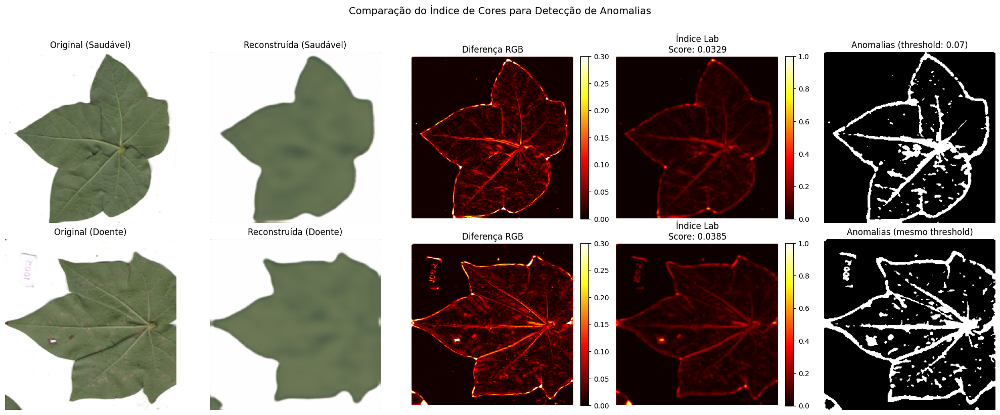


📈 AVALIAÇÃO DO MÉTODO EM TODO O DATASET
🔄 Avaliando dataset com índice de cores...


Processando doentes: 100%|██████████| 3/3 [00:03<00:00,  1.22s/it]
/tmp/ipython-input-633299407.py:351: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp = axes[1, 0].boxplot(box_data, labels=box_labels, patch_artist=True)


✅ Avaliação concluída!
   Saudáveis: 10 imagens
   Doentes: 10 imagens

📊 ANÁLISE ESTATÍSTICA DOS SCORES

📈 Saudáveis (índice de cores):
   Média: 0.034548
   Desvio padrão: 0.002912
   Mínimo: 0.029502
   Máximo: 0.040291
   Mediana: 0.034965

📈 Doentes (índice de cores):
   Média: 0.039218
   Desvio padrão: 0.003730
   Mínimo: 0.033575
   Máximo: 0.046586
   Mediana: 0.039123

🎯 Separabilidade entre classes: 0.7030

🎯 DETERMINANDO THRESHOLD ÓTIMO
   Melhor threshold: 0.037538
   AUC: 0.8300
   Acurácia: 0.8500 (85.0%)
   Precisão: 0.8889
   Recall: 0.8000
   F1-Score: 0.8421
   TP: 8, FP: 1, TN: 9, FN: 2

📈 VISUALIZANDO RESULTADOS DA AVALIAÇÃO


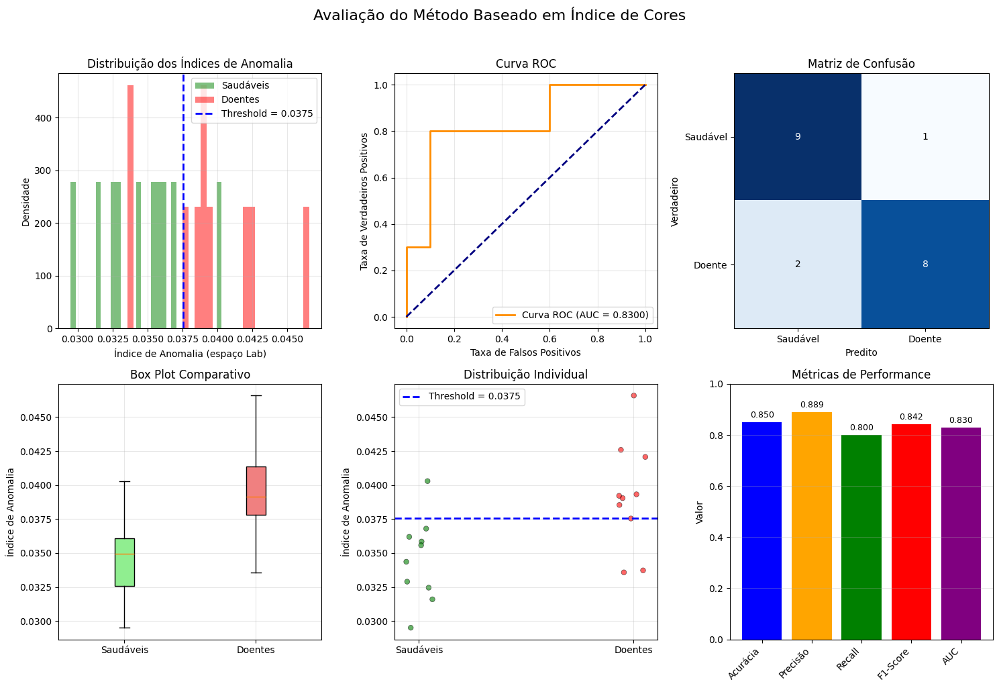

In [ ]:
print("\n🌈 IMPLEMENTANDO ÍNDICE DE CORES PARA DETECÇÃO DE ANOMALIAS")

def compute_color_anomaly_index(original, reconstructed, use_lab=True):
    """
    Calcula o índice de anomalia baseado em cores conforme o artigo

    Args:
        original: imagem original (numpy array HxWxC em RGB [0-255] ou float [0-1])
        reconstructed: imagem reconstruída (mesmo formato)
        use_lab: se True, usa espaço de cores Lab (mais perceptualmente uniforme)

    Returns:
        anomaly_map: mapa de anomalias 2D
        anomaly_score: score global de anomalia
    """


    if original.max() <= 1.0:
        original = (original * 255).astype(np.uint8)
    if reconstructed.max() <= 1.0:
        reconstructed = (reconstructed * 255).astype(np.uint8)

    if use_lab:

        original_lab = cv2.cvtColor(original, cv2.COLOR_RGB2LAB)
        reconstructed_lab = cv2.cvtColor(reconstructed, cv2.COLOR_RGB2LAB)


        diff = np.sqrt(np.sum((original_lab.astype(np.float32) -
                              reconstructed_lab.astype(np.float32)) ** 2, axis=2))
    else:
        diff = np.sqrt(np.sum((original.astype(np.float32) -
                              reconstructed.astype(np.float32)) ** 2, axis=2))


    if diff.max() > 0:
        diff_normalized = diff / diff.max()
    else:
        diff_normalized = diff


    diff_smoothed = cv2.GaussianBlur(diff_normalized, (5, 5), 0)


    anomaly_score = np.mean(diff_smoothed)

    return diff_smoothed, anomaly_score

def compute_multiscale_anomaly_index(original, reconstructed, scales=[1.0, 0.5, 0.25]):
    """
    Calcula índice de anomalia em múltiplas escalas (robusto a variações)
    """
    anomaly_maps = []
    scores = []

    for scale in scales:

        h, w = original.shape[:2]
        new_h, new_w = int(h * scale), int(w * scale)

        original_scaled = cv2.resize(original, (new_w, new_h))
        reconstructed_scaled = cv2.resize(reconstructed, (new_w, new_h))


        anomaly_map, score = compute_color_anomaly_index(
            original_scaled, reconstructed_scaled
        )


        anomaly_map_resized = cv2.resize(anomaly_map, (w, h))

        anomaly_maps.append(anomaly_map_resized)
        scores.append(score)


    combined_map = np.mean(anomaly_maps, axis=0)
    combined_score = np.mean(scores)

    return combined_map, combined_score


print("\n🧪 TESTANDO ÍNDICE DE CORES...")


test_img_idx = 0


orig_healthy_np = test_batch[test_img_idx].cpu().permute(1, 2, 0).numpy()
orig_healthy_np = (orig_healthy_np * 0.5) + 0.5  # [0, 1]
orig_healthy_np = (orig_healthy_np * 255).astype(np.uint8)  # [0, 255]

recon_healthy_np = recon_improved_healthy[test_img_idx].cpu().permute(1, 2, 0).numpy()
recon_healthy_np = (recon_healthy_np * 0.5) + 0.5
recon_healthy_np = (recon_healthy_np * 255).astype(np.uint8)


orig_diseased_np = diseased_batch[test_img_idx].cpu().permute(1, 2, 0).numpy()
orig_diseased_np = (orig_diseased_np * 0.5) + 0.5
orig_diseased_np = (orig_diseased_np * 255).astype(np.uint8)

recon_diseased_np = recon_improved_diseased[test_img_idx].cpu().permute(1, 2, 0).numpy()
recon_diseased_np = (recon_diseased_np * 0.5) + 0.5
recon_diseased_np = (recon_diseased_np * 255).astype(np.uint8)

print("📊 Calculando índices de anomalia...")


anomaly_map_healthy, score_healthy = compute_color_anomaly_index(
    orig_healthy_np, recon_healthy_np, use_lab=True
)

anomaly_map_diseased, score_diseased = compute_color_anomaly_index(
    orig_diseased_np, recon_diseased_np, use_lab=True
)

print(f"   Score saudável: {score_healthy:.6f}")
print(f"   Score doente: {score_diseased:.6f}")
print(f"   Diferença: {score_diseased - score_healthy:.6f}")


print("\n👀 VISUALIZANDO RESULTADOS DO ÍNDICE DE CORES...")

fig, axes = plt.subplots(2, 5, figsize=(20, 8))


axes[0, 0].imshow(orig_healthy_np)
axes[0, 0].set_title('Original (Saudável)')
axes[0, 0].axis('off')

axes[0, 1].imshow(recon_healthy_np)
axes[0, 1].set_title('Reconstruída (Saudável)')
axes[0, 1].axis('off')


diff_rgb_healthy = np.abs(orig_healthy_np.astype(np.float32) -
                         recon_healthy_np.astype(np.float32))
diff_rgb_healthy_norm = diff_rgb_healthy.mean(axis=2) / 255.0
im1 = axes[0, 2].imshow(diff_rgb_healthy_norm, cmap='hot', vmin=0, vmax=0.3)
axes[0, 2].set_title('Diferença RGB')
axes[0, 2].axis('off')
plt.colorbar(im1, ax=axes[0, 2], fraction=0.046, pad=0.04)


im2 = axes[0, 3].imshow(anomaly_map_healthy, cmap='hot', vmin=0, vmax=1)
axes[0, 3].set_title(f'Índice Lab\nScore: {score_healthy:.4f}')
axes[0, 3].axis('off')
plt.colorbar(im2, ax=axes[0, 3], fraction=0.046, pad=0.04)


threshold_healthy = score_healthy * 2  # Threshold adaptativo
binary_healthy = (anomaly_map_healthy > threshold_healthy).astype(np.uint8)
axes[0, 4].imshow(binary_healthy, cmap='gray')
axes[0, 4].set_title(f'Anomalias (threshold: {threshold_healthy:.2f})')
axes[0, 4].axis('off')


axes[1, 0].imshow(orig_diseased_np)
axes[1, 0].set_title('Original (Doente)')
axes[1, 0].axis('off')

axes[1, 1].imshow(recon_diseased_np)
axes[1, 1].set_title('Reconstruída (Doente)')
axes[1, 1].axis('off')


diff_rgb_diseased = np.abs(orig_diseased_np.astype(np.float32) -
                          recon_diseased_np.astype(np.float32))
diff_rgb_diseased_norm = diff_rgb_diseased.mean(axis=2) / 255.0
im3 = axes[1, 2].imshow(diff_rgb_diseased_norm, cmap='hot', vmin=0, vmax=0.3)
axes[1, 2].set_title('Diferença RGB')
axes[1, 2].axis('off')
plt.colorbar(im3, ax=axes[1, 2], fraction=0.046, pad=0.04)


im4 = axes[1, 3].imshow(anomaly_map_diseased, cmap='hot', vmin=0, vmax=1)
axes[1, 3].set_title(f'Índice Lab\nScore: {score_diseased:.4f}')
axes[1, 3].axis('off')
plt.colorbar(im4, ax=axes[1, 3], fraction=0.046, pad=0.04)


binary_diseased = (anomaly_map_diseased > threshold_healthy).astype(np.uint8)
axes[1, 4].imshow(binary_diseased, cmap='gray')
axes[1, 4].set_title(f'Anomalias (mesmo threshold)')
axes[1, 4].axis('off')

plt.suptitle('Comparação do Índice de Cores para Detecção de Anomalias',
             fontsize=14, y=1.02)
plt.tight_layout()
plt.show()


print("\n📈 AVALIAÇÃO DO MÉTODO EM TODO O DATASET")

def evaluate_dataset_with_color_index(model, healthy_loader, diseased_loader):
    """Avalia todo o dataset usando o índice de cores"""
    model.eval()

    healthy_scores = []
    diseased_scores = []

    with torch.no_grad():

        for inputs, _ in tqdm(healthy_loader, desc='Processando saudáveis'):
            inputs = inputs.to(device)
            outputs = model(inputs)

            for i in range(inputs.shape[0]):

                orig = inputs[i].cpu().permute(1, 2, 0).numpy()
                orig = (orig * 0.5 + 0.5) * 255
                orig = orig.astype(np.uint8)

                recon = outputs[i].cpu().permute(1, 2, 0).numpy()
                recon = (recon * 0.5 + 0.5) * 255
                recon = recon.astype(np.uint8)


                _, score = compute_color_anomaly_index(orig, recon, use_lab=True)
                healthy_scores.append(score)


        for inputs, _ in tqdm(diseased_loader, desc='Processando doentes'):
            inputs = inputs.to(device)
            outputs = model(inputs)

            for i in range(inputs.shape[0]):
                orig = inputs[i].cpu().permute(1, 2, 0).numpy()
                orig = (orig * 0.5 + 0.5) * 255
                orig = orig.astype(np.uint8)

                recon = outputs[i].cpu().permute(1, 2, 0).numpy()
                recon = (recon * 0.5 + 0.5) * 255
                recon = recon.astype(np.uint8)

                _, score = compute_color_anomaly_index(orig, recon, use_lab=True)
                diseased_scores.append(score)

    return np.array(healthy_scores), np.array(diseased_scores)


print("🔄 Avaliando dataset com índice de cores...")
healthy_scores_color, diseased_scores_color = evaluate_dataset_with_color_index(
    improved_ae, test_healthy_loader, test_diseased_loader
)

print(f"✅ Avaliação concluída!")
print(f"   Saudáveis: {len(healthy_scores_color)} imagens")
print(f"   Doentes: {len(diseased_scores_color)} imagens")


print("\n📊 ANÁLISE ESTATÍSTICA DOS SCORES")

def print_statistics(scores, label):
    """Imprime estatísticas dos scores"""
    print(f"\n📈 {label}:")
    print(f"   Média: {np.mean(scores):.6f}")
    print(f"   Desvio padrão: {np.std(scores):.6f}")
    print(f"   Mínimo: {np.min(scores):.6f}")
    print(f"   Máximo: {np.max(scores):.6f}")
    print(f"   Mediana: {np.median(scores):.6f}")

print_statistics(healthy_scores_color, "Saudáveis (índice de cores)")
print_statistics(diseased_scores_color, "Doentes (índice de cores)")


mean_healthy = np.mean(healthy_scores_color)
mean_diseased = np.mean(diseased_scores_color)
std_healthy = np.std(healthy_scores_color)
std_diseased = np.std(diseased_scores_color)

separability = abs(mean_diseased - mean_healthy) / (std_healthy + std_diseased)
print(f"\n🎯 Separabilidade entre classes: {separability:.4f}")

print("\n🎯 DETERMINANDO THRESHOLD ÓTIMO")

from sklearn.metrics import roc_curve, auc, confusion_matrix

all_scores = np.concatenate([healthy_scores_color, diseased_scores_color])
all_labels = np.concatenate([np.zeros_like(healthy_scores_color),
                             np.ones_like(diseased_scores_color)])

fpr, tpr, thresholds = roc_curve(all_labels, all_scores)
roc_auc = auc(fpr, tpr)

youden_idx = np.argmax(tpr - fpr)
best_threshold = thresholds[youden_idx]

predictions = (all_scores >= best_threshold).astype(int)
cm = confusion_matrix(all_labels, predictions)
tn, fp, fn, tp = cm.ravel()

accuracy = (tp + tn) / (tp + tn + fp + fn)
precision = tp / (tp + fp) if (tp + fp) > 0 else 0
recall = tp / (tp + fn) if (tp + fn) > 0 else 0
f1 = 2 * precision * recall / (precision + recall) if (precision + recall) > 0 else 0

print(f"   Melhor threshold: {best_threshold:.6f}")
print(f"   AUC: {roc_auc:.4f}")
print(f"   Acurácia: {accuracy:.4f} ({accuracy*100:.1f}%)")
print(f"   Precisão: {precision:.4f}")
print(f"   Recall: {recall:.4f}")
print(f"   F1-Score: {f1:.4f}")
print(f"   TP: {tp}, FP: {fp}, TN: {tn}, FN: {fn}")

print("\n📈 VISUALIZANDO RESULTADOS DA AVALIAÇÃO")

fig, axes = plt.subplots(2, 3, figsize=(15, 10))

axes[0, 0].hist(healthy_scores_color, alpha=0.5, label='Saudáveis',
                bins=30, color='green', density=True)
axes[0, 0].hist(diseased_scores_color, alpha=0.5, label='Doentes',
                bins=30, color='red', density=True)
axes[0, 0].axvline(x=best_threshold, color='blue', linestyle='--',
                  linewidth=2, label=f'Threshold = {best_threshold:.4f}')
axes[0, 0].set_xlabel('Índice de Anomalia (espaço Lab)')
axes[0, 0].set_ylabel('Densidade')
axes[0, 0].set_title('Distribuição dos Índices de Anomalia')
axes[0, 0].legend()
axes[0, 0].grid(True, alpha=0.3)


axes[0, 1].plot(fpr, tpr, color='darkorange', lw=2,
                label=f'Curva ROC (AUC = {roc_auc:.4f})')
axes[0, 1].plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
axes[0, 1].set_xlabel('Taxa de Falsos Positivos')
axes[0, 1].set_ylabel('Taxa de Verdadeiros Positivos')
axes[0, 1].set_title('Curva ROC')
axes[0, 1].legend(loc="lower right")
axes[0, 1].grid(True, alpha=0.3)

im = axes[0, 2].imshow(cm, interpolation='nearest', cmap=plt.cm.Blues)
axes[0, 2].set_title('Matriz de Confusão')
axes[0, 2].set_xticks([0, 1])
axes[0, 2].set_yticks([0, 1])
axes[0, 2].set_xticklabels(['Saudável', 'Doente'])
axes[0, 2].set_yticklabels(['Saudável', 'Doente'])
axes[0, 2].set_ylabel('Verdadeiro')
axes[0, 2].set_xlabel('Predito')


thresh = cm.max() / 2.
for i in range(cm.shape[0]):
    for j in range(cm.shape[1]):
        axes[0, 2].text(j, i, format(cm[i, j], 'd'),
                       ha="center", va="center",
                       color="white" if cm[i, j] > thresh else "black")

box_data = [healthy_scores_color, diseased_scores_color]
box_labels = ['Saudáveis', 'Doentes']
bp = axes[1, 0].boxplot(box_data, labels=box_labels, patch_artist=True)
bp['boxes'][0].set_facecolor('lightgreen')
bp['boxes'][1].set_facecolor('lightcoral')
axes[1, 0].set_ylabel('Índice de Anomalia')
axes[1, 0].set_title('Box Plot Comparativo')
axes[1, 0].grid(True, alpha=0.3)

x_positions = np.concatenate([
    np.random.normal(0, 0.05, len(healthy_scores_color)),
    np.random.normal(1, 0.05, len(diseased_scores_color))
])
all_scores_scatter = np.concatenate([healthy_scores_color, diseased_scores_color])
colors = ['green'] * len(healthy_scores_color) + ['red'] * len(diseased_scores_color)

axes[1, 1].scatter(x_positions, all_scores_scatter, alpha=0.6, c=colors, s=30, edgecolors='black', linewidth=0.5)
axes[1, 1].axhline(y=best_threshold, color='blue', linestyle='--',
                  linewidth=2, label=f'Threshold = {best_threshold:.4f}')
axes[1, 1].set_xticks([0, 1])
axes[1, 1].set_xticklabels(['Saudáveis', 'Doentes'])
axes[1, 1].set_ylabel('Índice de Anomalia')
axes[1, 1].set_title('Distribuição Individual')
axes[1, 1].legend()
axes[1, 1].grid(True, alpha=0.3)

metrics = {
    'Acurácia': accuracy,
    'Precisão': precision,
    'Recall': recall,
    'F1-Score': f1,
    'AUC': roc_auc
}

bars = axes[1, 2].bar(range(len(metrics)), list(metrics.values()),
                     color=['blue', 'orange', 'green', 'red', 'purple'])
axes[1, 2].set_xticks(range(len(metrics)))
axes[1, 2].set_xticklabels(list(metrics.keys()), rotation=45, ha='right')
axes[1, 2].set_ylabel('Valor')
axes[1, 2].set_title('Métricas de Performance')
axes[1, 2].set_ylim([0, 1])
axes[1, 2].grid(True, alpha=0.3, axis='y')

for bar, value in zip(bars, metrics.values()):
    height = bar.get_height()
    axes[1, 2].text(bar.get_x() + bar.get_width()/2., height + 0.01,
                   f'{value:.3f}', ha='center', va='bottom', fontsize=9)

plt.suptitle('Avaliação do Método Baseado em Índice de Cores', fontsize=16, y=1.02)
plt.tight_layout()
plt.show()


#Resultados obtidos:

In [ ]:
print(f"   • Acurácia: {accuracy*100:.1f}%")
print(f"   • AUC: {roc_auc:.4f}")
print(f"   • F1-Score: {f1:.4f}")
print(f"   • Separabilidade: {separability:.4f}")

   • Acurácia: 85.0%
   • AUC: 0.8300
   • F1-Score: 0.8421
   • Separabilidade: 0.7030


#Implementação do Grad-CAM

Nesta etapa, adicionamos visualizações explicativas ao nosso sistema através do Grad-CAM (Gradient-weighted Class Activation Mapping). Implementamos uma versão personalizada que calcula os gradientes das camadas convolucionais do encoder para identificar quais regiões das imagens são mais importantes para a detecção de anomalias. O Grad-CAM gera mapas de calor que sobrepõem as áreas relevantes nas imagens originais, permitindo entender visualmente onde o modelo está focando sua atenção durante o processo de reconstrução e detecção de anomalias.


🧪 TESTANDO GRAD-CAM...
🔍 Buscando camadas adequadas para Grad-CAM...
   ✅ Camada encontrada: 0 - Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
   ✅ Camada encontrada: 3 - Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
   ✅ Camada encontrada: 6 - Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
   ✅ Camada encontrada: 9 - Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
   ✅ Camada encontrada: 12 - Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
   ✅ Camada encontrada: 15 - Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
   ✅ Camada encontrada: 18 - Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
🎯 Usando camada: Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
🔄 Calculando Grad-CAM para imagem saudável...
🔄 Calculando Grad-CAM para imagem doente...
✅ Grad-CAM calculado com sucesso!
   Dimensões cam_healthy: (256, 256)
   Dimensões or

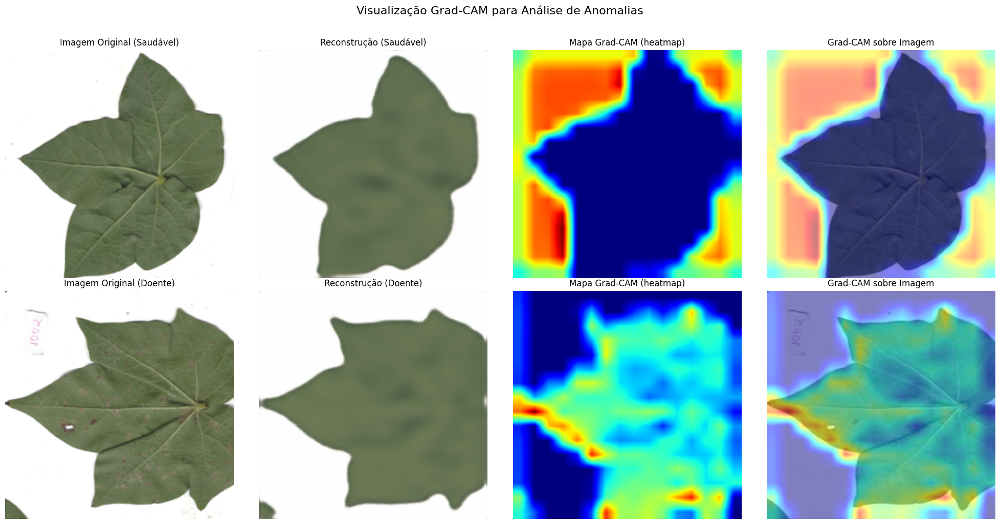


🔬 ANÁLISE COMBINADA: GRAD-CAM + ÍNDICE DE CORES


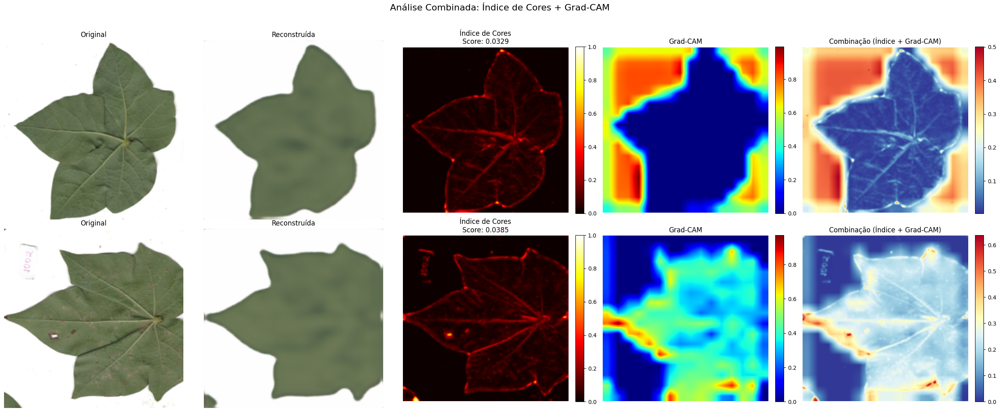


📊 ANÁLISE QUANTITATIVA
   Correlação Índice de Cores vs Grad-CAM:
   • Saudável: -0.4785
   • Doente: 0.3370

📈 Estatísticas do Grad-CAM:
   Saudável - Média: 0.2969, Max: 0.9936
   Doente - Média: 0.2880, Max: 0.9712


In [ ]:
def compute_grad_cam_manual(model, input_tensor, target_layer):
    """
    Computa Grad-CAM manualmente para um modelo específico
    """
    model.eval()

    # Registra hook para capturar gradientes
    gradients = None
    activations = None

    def forward_hook(module, input, output):
        nonlocal activations
        activations = output.detach()

    def backward_hook(module, grad_input, grad_output):
        nonlocal gradients
        gradients = grad_output[0].detach()

    # Registra hooks
    handle_forward = target_layer.register_forward_hook(forward_hook)
    handle_backward = target_layer.register_backward_hook(backward_hook)

    # Forward pass
    model.zero_grad()
    output = model(input_tensor)

    # Backward pass (usando a saída como "score")
    if isinstance(output, tuple):
        anomaly_score = output[0]
    else:
        # Calcula score de anomalia como diferença média
        reconstructed = output
        anomaly_score = torch.mean(torch.abs(input_tensor - reconstructed))

    anomaly_score.backward()

    # Remove hooks
    handle_forward.remove()
    handle_backward.remove()

    if gradients is not None and activations is not None:
        # Pooling dos gradientes (média sobre altura e largura)
        weights = torch.mean(gradients, dim=[2, 3], keepdim=True)

        # Combinação ponderada das ativações
        cam = torch.sum(weights * activations, dim=1, keepdim=True)
        cam = F.relu(cam)  # Apenas valores positivos

        # Normaliza
        cam_min = cam.min()
        cam_max = cam.max()
        if cam_max - cam_min > 0:
            cam = (cam - cam_min) / (cam_max - cam_min)

        cam_resized = F.interpolate(cam, size=(256, 256), mode='bilinear', align_corners=False)

        return cam_resized.squeeze().cpu().numpy()
    else:
        return None

print("\n🧪 TESTANDO GRAD-CAM...")

sample_idx = 0
input_tensor = test_batch[sample_idx:sample_idx+1].to(device)  # Saudável
input_tensor_diseased = diseased_batch[sample_idx:sample_idx+1].to(device)  # Doente

# Prepara imagem original para visualização
orig_image = test_batch[sample_idx].cpu().permute(1, 2, 0).numpy()
orig_image = (orig_image * 0.5) + 0.5  # Desnormaliza para [0, 1]

orig_image_diseased = diseased_batch[sample_idx].cpu().permute(1, 2, 0).numpy()
orig_image_diseased = (orig_image_diseased * 0.5) + 0.5

# Encontra uma camada adequada para Grad-CAM
print("🔍 Buscando camadas adequadas para Grad-CAM...")
target_layers = []

# Procura por camadas convolucionais no encoder
for name, module in improved_ae.encoder.named_children():
    if isinstance(module, nn.Conv2d) or isinstance(module, nn.ConvTranspose2d):
        print(f"   ✅ Camada encontrada: {name} - {module}")
        target_layers.append(module)

if not target_layers:
    # Se não encontrou, usa as primeiras camadas do encoder
    print("   ⚠️  Nenhuma camada conv encontrada, usando encoder[0]")
    if len(improved_ae.encoder) > 0:
        target_layers = [improved_ae.encoder[0]]

# Usa a primeira camada conv encontrada
if target_layers:
    target_layer = target_layers[-1]  # Usa uma camada mais profunda
    print(f"🎯 Usando camada: {target_layer}")

    # Calcula Grad-CAM para imagem saudável
    print("🔄 Calculando Grad-CAM para imagem saudável...")
    cam_healthy = compute_grad_cam_manual(improved_ae, input_tensor, target_layer)

    print("🔄 Calculando Grad-CAM para imagem doente...")
    cam_diseased = compute_grad_cam_manual(improved_ae, input_tensor_diseased, target_layer)

    if cam_healthy is not None and cam_diseased is not None:
        print("✅ Grad-CAM calculado com sucesso!")
        print(f"   Dimensões cam_healthy: {cam_healthy.shape}")
        print(f"   Dimensões orig_image: {orig_image.shape}")

        # CORREÇÃO: Garante que o CAM tem as mesmas dimensões da imagem
        # Se show_cam_on_image falhar, usamos nossa própria função
        try:
            from pytorch_grad_cam.utils.image import show_cam_on_image
            # Tenta usar a função original
            cam_healthy_on_image = show_cam_on_image(orig_image, cam_healthy, use_rgb=True)
            cam_diseased_on_image = show_cam_on_image(orig_image_diseased, cam_diseased, use_rgb=True)
        except ValueError as e:
            print(f"⚠️  Erro na função show_cam_on_image: {e}")
            print("   Usando função alternativa...")

            # Função alternativa para mostrar CAM
            def show_cam_on_image_alt(img, cam, use_rgb=True):
                """Alternativa para show_cam_on_image"""
                # Redimensiona cam para o tamanho da imagem se necessário
                if cam.shape != img.shape[:2]:
                    cam = cv2.resize(cam, (img.shape[1], img.shape[0]))

                # Cria heatmap
                heatmap = cv2.applyColorMap(np.uint8(255 * cam), cv2.COLORMAP_JET)
                if use_rgb:
                    heatmap = cv2.cvtColor(heatmap, cv2.COLOR_BGR2RGB)

                # Combina com imagem
                cam_on_image = heatmap / 255.0 * 0.5 + img * 0.5
                return cam_on_image

            cam_healthy_on_image = show_cam_on_image_alt(orig_image, cam_healthy)
            cam_diseased_on_image = show_cam_on_image_alt(orig_image_diseased, cam_diseased)

        print("\n👁️ VISUALIZANDO RESULTADOS DO GRAD-CAM...")

        fig, axes = plt.subplots(2, 4, figsize=(20, 10))

        # Linha 1: Imagem saudável
        axes[0, 0].imshow(orig_image)
        axes[0, 0].set_title('Imagem Original (Saudável)')
        axes[0, 0].axis('off')

        # Reconstrução
        with torch.no_grad():
            recon_healthy = improved_ae(input_tensor)[0].cpu().permute(1, 2, 0).numpy()
            recon_healthy = (recon_healthy * 0.5) + 0.5

        axes[0, 1].imshow(recon_healthy)
        axes[0, 1].set_title('Reconstrução (Saudável)')
        axes[0, 1].axis('off')

        # Mapa Grad-CAM
        axes[0, 2].imshow(cam_healthy, cmap='jet')
        axes[0, 2].set_title('Mapa Grad-CAM (heatmap)')
        axes[0, 2].axis('off')

        # Grad-CAM sobreposta
        axes[0, 3].imshow(cam_healthy_on_image)
        axes[0, 3].set_title('Grad-CAM sobre Imagem')
        axes[0, 3].axis('off')

        # Linha 2: Imagem doente
        axes[1, 0].imshow(orig_image_diseased)
        axes[1, 0].set_title('Imagem Original (Doente)')
        axes[1, 0].axis('off')

        # Reconstrução doente
        with torch.no_grad():
            recon_diseased = improved_ae(input_tensor_diseased)[0].cpu().permute(1, 2, 0).numpy()
            recon_diseased = (recon_diseased * 0.5) + 0.5

        axes[1, 1].imshow(recon_diseased)
        axes[1, 1].set_title('Reconstrução (Doente)')
        axes[1, 1].axis('off')

        # Mapa Grad-CAM doente
        axes[1, 2].imshow(cam_diseased, cmap='jet')
        axes[1, 2].set_title('Mapa Grad-CAM (heatmap)')
        axes[1, 2].axis('off')

        # Grad-CAM sobreposta doente
        axes[1, 3].imshow(cam_diseased_on_image)
        axes[1, 3].set_title('Grad-CAM sobre Imagem')
        axes[1, 3].axis('off')

        plt.suptitle('Visualização Grad-CAM para Análise de Anomalias',
                    fontsize=16, y=1.02)
        plt.tight_layout()
        plt.show()

        # Análise combinada: Grad-CAM + Índice de Cores
        print("\n🔬 ANÁLISE COMBINADA: GRAD-CAM + ÍNDICE DE CORES")

        # Calcula índice de cores para as mesmas imagens
        orig_healthy_rgb = (orig_image * 255).astype(np.uint8)
        recon_healthy_rgb = (recon_healthy * 255).astype(np.uint8)

        orig_diseased_rgb = (orig_image_diseased * 255).astype(np.uint8)
        recon_diseased_rgb = (recon_diseased * 255).astype(np.uint8)

        anomaly_map_healthy, score_healthy = compute_color_anomaly_index(
            orig_healthy_rgb, recon_healthy_rgb, use_lab=True
        )

        anomaly_map_diseased, score_diseased = compute_color_anomaly_index(
            orig_diseased_rgb, recon_diseased_rgb, use_lab=True
        )

        # Cria visualização combinada
        fig, axes = plt.subplots(2, 5, figsize=(25, 10))

        # Linha 1: Saudável
        axes[0, 0].imshow(orig_image)
        axes[0, 0].set_title('Original')
        axes[0, 0].axis('off')

        axes[0, 1].imshow(recon_healthy)
        axes[0, 1].set_title('Reconstruída')
        axes[0, 1].axis('off')

        # Índice de cores
        im1 = axes[0, 2].imshow(anomaly_map_healthy, cmap='hot', vmin=0, vmax=1)
        axes[0, 2].set_title(f'Índice de Cores\nScore: {score_healthy:.4f}')
        axes[0, 2].axis('off')
        plt.colorbar(im1, ax=axes[0, 2], fraction=0.046, pad=0.04)

        # Grad-CAM
        im2 = axes[0, 3].imshow(cam_healthy, cmap='jet')
        axes[0, 3].set_title('Grad-CAM')
        axes[0, 3].axis('off')
        plt.colorbar(im2, ax=axes[0, 3], fraction=0.046, pad=0.04)

        # Combinação
        # Garante que ambos têm o mesmo tamanho
        if cam_healthy.shape != anomaly_map_healthy.shape:
            cam_healthy_resized = cv2.resize(cam_healthy,
                                            (anomaly_map_healthy.shape[1],
                                             anomaly_map_healthy.shape[0]))
        else:
            cam_healthy_resized = cam_healthy

        combined_healthy = 0.5 * anomaly_map_healthy + 0.5 * cam_healthy_resized
        im3 = axes[0, 4].imshow(combined_healthy, cmap='RdYlBu_r')
        axes[0, 4].set_title('Combinação (Índice + Grad-CAM)')
        axes[0, 4].axis('off')
        plt.colorbar(im3, ax=axes[0, 4], fraction=0.046, pad=0.04)

        # Linha 2: Doente
        axes[1, 0].imshow(orig_image_diseased)
        axes[1, 0].set_title('Original')
        axes[1, 0].axis('off')

        axes[1, 1].imshow(recon_diseased)
        axes[1, 1].set_title('Reconstruída')
        axes[1, 1].axis('off')

        # Índice de cores
        im4 = axes[1, 2].imshow(anomaly_map_diseased, cmap='hot', vmin=0, vmax=1)
        axes[1, 2].set_title(f'Índice de Cores\nScore: {score_diseased:.4f}')
        axes[1, 2].axis('off')
        plt.colorbar(im4, ax=axes[1, 2], fraction=0.046, pad=0.04)

        # Grad-CAM
        im5 = axes[1, 3].imshow(cam_diseased, cmap='jet')
        axes[1, 3].set_title('Grad-CAM')
        axes[1, 3].axis('off')
        plt.colorbar(im5, ax=axes[1, 3], fraction=0.046, pad=0.04)

        # Combinação
        if cam_diseased.shape != anomaly_map_diseased.shape:
            cam_diseased_resized = cv2.resize(cam_diseased,
                                             (anomaly_map_diseased.shape[1],
                                              anomaly_map_diseased.shape[0]))
        else:
            cam_diseased_resized = cam_diseased

        combined_diseased = 0.5 * anomaly_map_diseased + 0.5 * cam_diseased_resized
        im6 = axes[1, 4].imshow(combined_diseased, cmap='RdYlBu_r')
        axes[1, 4].set_title('Combinação (Índice + Grad-CAM)')
        axes[1, 4].axis('off')
        plt.colorbar(im6, ax=axes[1, 4], fraction=0.046, pad=0.04)

        plt.suptitle('Análise Combinada: Índice de Cores + Grad-CAM',
                    fontsize=16, y=1.02)
        plt.tight_layout()
        plt.show()

        print("\n📊 ANÁLISE QUANTITATIVA")

        # Garante tamanhos iguais para cálculo de correlação
        cam_healthy_for_corr = cv2.resize(cam_healthy,
                                         (anomaly_map_healthy.shape[1],
                                          anomaly_map_healthy.shape[0]))
        cam_diseased_for_corr = cv2.resize(cam_diseased,
                                          (anomaly_map_diseased.shape[1],
                                           anomaly_map_diseased.shape[0]))

        # Calcula correlação
        corr_healthy = np.corrcoef(
            anomaly_map_healthy.flatten(),
            cam_healthy_for_corr.flatten()
        )[0, 1]

        corr_diseased = np.corrcoef(
            anomaly_map_diseased.flatten(),
            cam_diseased_for_corr.flatten()
        )[0, 1]

        print(f"   Correlação Índice de Cores vs Grad-CAM:")
        print(f"   • Saudável: {corr_healthy:.4f}")
        print(f"   • Doente: {corr_diseased:.4f}")

        # Mostra análise estatística
        print(f"\n📈 Estatísticas do Grad-CAM:")
        print(f"   Saudável - Média: {np.mean(cam_healthy):.4f}, Max: {np.max(cam_healthy):.4f}")
        print(f"   Doente - Média: {np.mean(cam_diseased):.4f}, Max: {np.max(cam_diseased):.4f}")

    else:
        print("❌ Não foi possível calcular Grad-CAM")
else:
    print("❌ Nenhuma camada adequada encontrada para Grad-CAM")

#Relatório

Os resultados obtidos foram detalhados e documentos num pdf que será subido juntamente ao trabalho